In [1]:
using StatsPlots
using LinearAlgebra
using Random
using Statistics
using Distributions
using Plots

In [3]:
function MHRW(energia,np,p0,δ=0.5,iterations=10000)
    
    
    #Muestras del algorimo
    samples = zeros(np,iterations)
    #Punto de partida
    ## Se escoge el punto inicial obtenido de invertir el operador A
    samples[:,1] = p0
    
    #Probabilidades
    probabilities = zeros(iterations)
    probabilities[1] = energia(samples[:,1])
    
    #Tasa de aceptación
    rateAlpha = 0
    
    # Algoritmo Metrópolis-Hastings
    for i in 1:iterations-1
        
        #Estado actual
        Xᵢ = samples[:,i]
        #Estado propuesto
        X₊ = rand(MvNormal(Xᵢ,δ*I))
        
        #π(Estado actual → Estado propuesto)
        pXᵢX₊ = energia(X₊) * pdf(MvNormal(Xᵢ,δ*I),X₊)
        #π(Estado propuesto → Estado actual)
        pX₊Xᵢ = energia(Xᵢ) * pdf(MvNormal(X₊,δ*I),Xᵢ)
        #Tasa de aceptacion α
        alpha = min(1, pXᵢX₊/pX₊Xᵢ)
    
        #Aceptación o rechazo del estado propuesto
        u = rand()    
        if u < alpha 				#Aceptación
            samples[:,i+1] = X₊
            probabilities[i+1] = energia(X₊)
            rateAlpha += 1
        else 						#Rechazo
            samples[:,i+1] = Xᵢ
            probabilities[i+1] = energia(Xᵢ)
        end
    end
    rateAlpha /= (iterations-1)
    MAP = samples[:,findmax(probabilities)[2]]
    CM = [mean(row) for row in eachrow(samples)]
    return samples, probabilities, MAP, CM, rateAlpha
end

MHRW (generic function with 3 methods)

In [126]:
function MCIntegration(s)
    n = length(s)
    integral = zeros(n)
    convergence = zeros(n-1)
    for i in 1:n
        integral[i] = mean(s[1:i])
    end
    for j in 2:n
        convergence[j-1] = abs(integral[j]-integral[j-1])
    end
    A = [ones(n-1) log.(1:n-1) ]
    #rate = (A' * A + 0.001*I) \ (A' * log.(convergence .+ 0.001))
    rate = A \ log.(convergence .+ 1E-8)
    return convergence, rate
end

MCIntegration (generic function with 1 method)

# Metropolis Hastings

In [30]:
function energia2(p)
    x = p[1]
    y = p[2]
    a = (1/20)*((x*y)^2 + x^2 + y^2 - 8*x - 8*y)
    return exp(-a) 
end
ran = range(-5, 10, length=100)
contour2 = contour(ran, ran, [energia2((i, j)) for j in ran, i in ran], levels=20, linewidth=2, color=:RdBu, xlabel="x",ylabel="y", title="Contour plot of exp(f)")
savefig("4_RB_contours.png")

"C:\\Users\\carlo\\4_RB_contours.png"

In [106]:
samples2, probabilities2, Alpha2, MAP2, CM2 = MHRW(energia2,2,[-10.0,-10.0],0.2,10000)

([-10.0 -10.0 … 0.9790716661104388 0.9922899653303976; -10.0 -10.0 … 0.1501329806347612 0.16505549391217653], [1.0850715436432725e-225, 1.0850715436432725e-225, 1.0850715436432725e-225, 1.3743616263202846e-188, 3.410122180958136e-173, 3.410122180958136e-173, 3.224372396253785e-152, 3.224372396253785e-152, 3.357438103633323e-129, 1.1797029487023256e-91  …  1.6730636799941707, 1.5457142591353665, 1.7385394446719724, 1.308434115978493, 1.3225306256918852, 1.303052814323748, 1.3704326326230198, 1.3211995608477995, 1.4941320651170105, 1.508329590497974], [0.26794532344846284, 3.746334553412173], [1.4934701593003992, 1.4307226382002554], 0.8272827282728272)

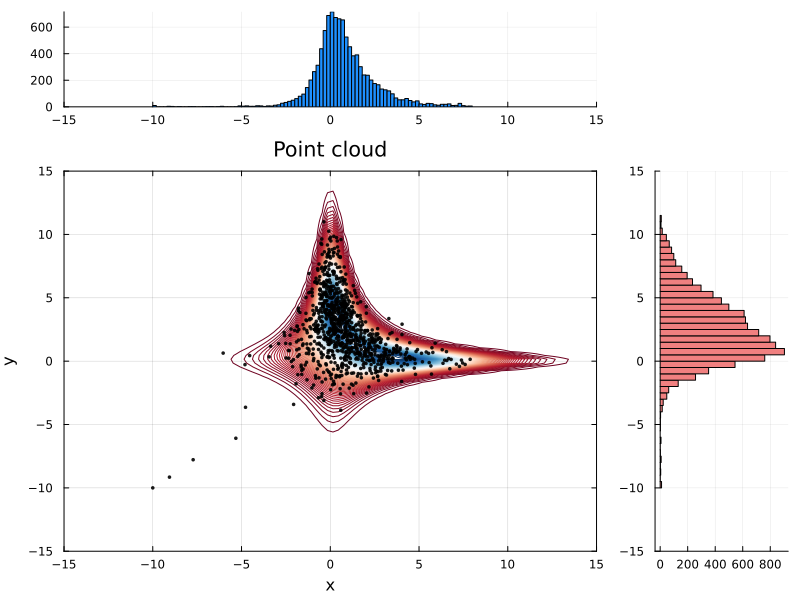

In [52]:
xhist = samples2[1, :]
yhist = samples2[2, :]
lim = 15
ran = range(-lim, lim, length=100)
sxy = contour(ran, ran, [energia2((i, j)) for j in ran, i in ran], levels=100, linewidth=1, color=:RdBu,xlim=(-lim,lim),ylim=(-lim,lim))
sxy = scatter!(xhist[1:10:end], yhist[1:10:end], markersize=2, title="Point cloud", color="black", alpha=0.9,
    xlabel="x", ylabel="y", border=:box,xlim=(-lim,lim),ylim=(-lim,lim),colorbar=false)
hx = histogram(xhist,color=:dodgerblue,xlim=(-lim,lim))
hy = histogram(yhist, orientation=:horizontal,ylim=(-lim,lim),color=:lightcoral)
p0 = Plots.Plot()
cuadricula = grid(2,2, heights=(0.2,0.8), widths=(0.8,0.2))
plot(hx, p0, sxy, hy, legend=:none, layout=cuadricula,size=(800,600))


# Gibbs sampler

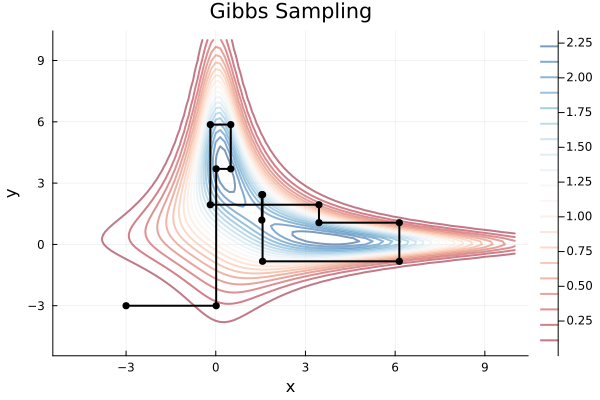

In [105]:
# Número de iteraciones
N = 10000

# Inicialización de las cadenas
x = zeros(N+1)
y = zeros(N+1)

# Condiciones iniciales
x[1] = -3.0
y[1] = -3.0

# Definir las funciones de media y desviación estándar
sig = (z, i) -> sqrt(10.0 / (1.0 + z[i]^2))
mu = (z, i) -> 4.0 / (1.0 + z[i]^2)

# Algoritmo de Gibbs sampling
for i in 2:2:N
    sig_x = sig(y, i-1)
    mu_x = mu(y, i-1)
    x[i] = rand(Normal(mu_x, sig_x))
    y[i] = y[i-1]

    sig_y = sig(x, i)
    mu_y = mu(x, i)
    y[i+1] = rand(Normal(mu_y, sig_y))
    x[i+1] = x[i]
end

contour(range(-5, 10, length=100), range(-5, 10, length=100), 
    [energia2((i, j)) for j in range(-5, 10, length=100), 
            i in range(-5, 10, length=100)], levels=20, linewidth=2, color=:RdBu,alpha=0.55)
plot!(x[1:15], y[1:15], lw=2, label="", xlabel="x", ylabel="y", title="Gibbs Sampling",color="black")
scatter!(x[1:15], y[1:15], lw=2, markersize=4,label="",color="black")
#savefig("4_RB_GibbsSomeSamples.png")

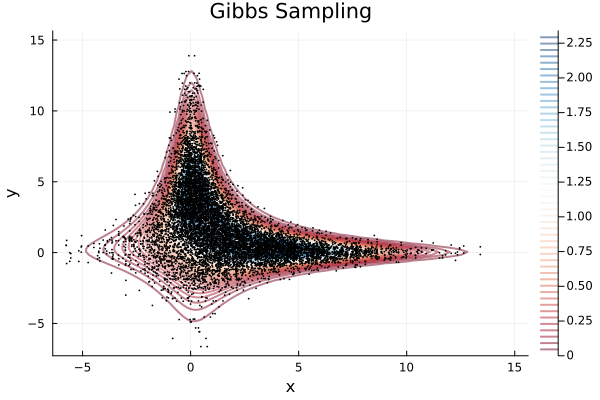

In [73]:
contour(range(-5, 15, length=100), range(-5, 15, length=100), 
    [energia2((i, j)) for j in range(-5, 15, length=100), 
            i in range(-5, 15, length=100)], levels=50, linewidth=2, color=:RdBu,alpha=0.5)
scatter!(x, y, markersize=1, label="", xlabel="x", ylabel="y", title="Gibbs Sampling",color="black")

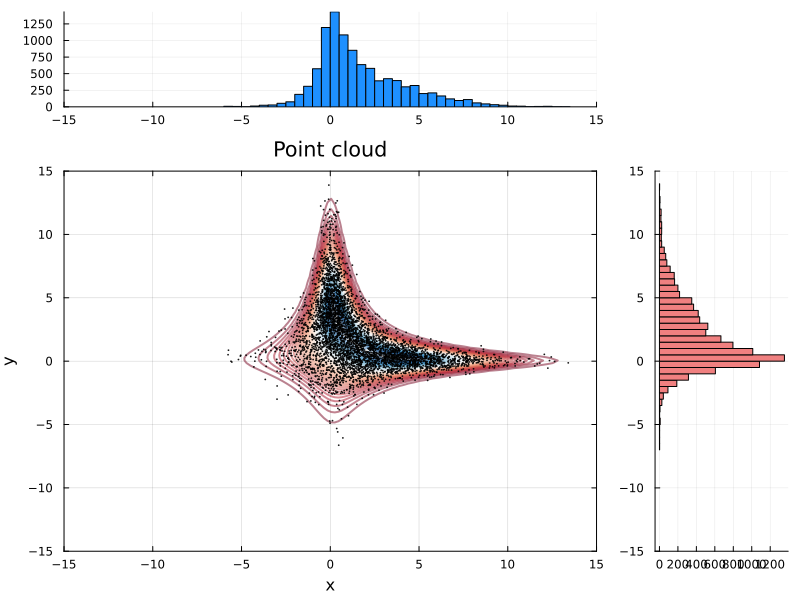

In [74]:
xhist = x
yhist = y
lim = 15
ran = range(-lim, lim, length=100)
sxy = contour(range(-5, 15, length=100), range(-5, 15, length=100), 
    [energia2((i, j)) for j in range(-5, 15, length=100), 
            i in range(-5, 15, length=100)], levels=50, linewidth=2, color=:RdBu,alpha=0.5)
sxy = scatter!(xhist[1:2:end], yhist[1:2:end], markersize=1, title="Point cloud", color="black", alpha=0.9,
    xlabel="x", ylabel="y", border=:box,xlim=(-lim,lim),ylim=(-lim,lim),colorbar=false)
hx = histogram(xhist,color=:dodgerblue,xlim=(-lim,lim))
hy = histogram(yhist, orientation=:horizontal,ylim=(-lim,lim),color=:lightcoral)
p0 = Plots.Plot()
cuadricula = grid(2,2, heights=(0.2,0.8), widths=(0.8,0.2))
plot(hx, p0, sxy, hy, legend=:none, layout=cuadricula,size=(800,600))


# Bi-walk

In [62]:
function bi_walk(energia,np,p0,pp0,δ₀=1,iterations=10000)

    function bienergia(X₁,X₂)
        return sqrt(abs(energia(X₁)*energia(X₂)))
    end
    
    #Muestras del algorimo
    samples = zeros(2*np,iterations)
    #Punto de partida
    samples[1:np,1] = p0
    samples[np+1:2*np,1] = pp0

    
    
    #Probabilidades
    probabilities = zeros(iterations)
    probabilities[1] = bienergia(samples[1:np,1],samples[np+1:2*np,1])


    #Tasa de aceptación
    rateAlpha = 0
    
    # Algoritmo Metrópolis-Hastings
    for i in 1:iterations-1
        
        #Estado actual
        Xᵢ = samples[1:np,i]
        Xᵢ⁺ = samples[np+1:2*np,i]

        
        u = rand()
        δ = norm(Xᵢ⁺-Xᵢ) + δ₀
        
        if rand(Bernoulli(0.5))
            samples[1:np,i+1] = Xᵢ
            #Estado propuesto
            Xₚ =  rand(MvNormal(Xᵢ⁺,δ*I))
            #π(Estado actual → Estado propuesto)
            pfor = energia(Xₚ) * pdf(MvNormal(Xₚ,(norm(Xₚ-Xᵢ) + 1)*I),Xᵢ⁺)
            #π(Estado propuesto → Estado actual)
            pback = energia(Xᵢ⁺) * pdf(MvNormal(Xᵢ⁺,δ*I),Xₚ)
            #Tasa de aceptacion α
            alpha = min(1, pfor/pback)              
            if u < alpha 				#Aceptación
                samples[np+1:2*np,i+1] = Xₚ
                probabilities[i+1] = bienergia(Xᵢ,Xₚ)
                rateAlpha += 1
            else 						#Rechazo
                samples[np+1:2*np,i+1] = Xᵢ⁺
                probabilities[i+1] = bienergia(Xᵢ,Xᵢ⁺)
            end
            
        else 
            samples[np+1:2*np,i+1] = Xᵢ⁺
            #Estado propuesto
            Xₚ =  rand(MvNormal(Xᵢ,δ*I))
            #π(Estado actual → Estado propuesto)
            pfor = energia(Xₚ) * pdf(MvNormal(Xₚ,(norm(Xₚ-Xᵢ⁺) + 1)*I),Xᵢ)
            #π(Estado propuesto → Estado actual)
            pback = energia(Xᵢ⁺) * pdf(MvNormal(Xᵢ,δ*I),Xₚ)
            #Tasa de aceptacion α
            alpha = min(1, pfor/pback)                
            if u < alpha 				#Aceptación
                samples[1:np,i+1] = Xₚ
                probabilities[i+1] = bienergia(Xₚ,Xᵢ⁺)
                rateAlpha += 1 
            else 						#Rechazo
                samples[1:np,i+1] = Xᵢ
                probabilities[i+1] = bienergia(Xᵢ,Xᵢ⁺)
            end
        end
    end
    rateAlpha /= iterations-1
    return samples, probabilities, rateAlpha
end

bi_walk (generic function with 3 methods)

In [164]:
samples2b, probabilities2b, rateAlpha2b = bi_walk(energia2,2,[5.0,5.0],[4.0,-4.0],1,10000)
samples2b

4×10000 Matrix{Float64}:
  5.0   5.0       5.0       5.0      …   4.79205    0.655812   0.655812
  5.0   5.0       5.0       5.0         -0.171821  -0.925142  -0.925142
  4.0   9.08137   9.08137   9.08137     -0.119961  -0.119961  -0.119961
 -4.0  -1.60331  -1.60331  -1.60331      4.50151    4.50151    4.50151

In [165]:
rateAlpha2b

0.38093809380938093

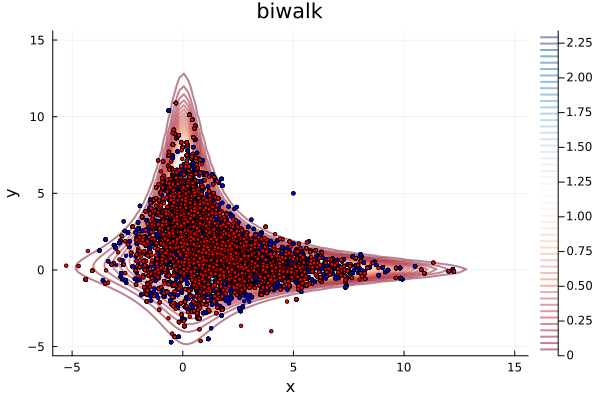

In [108]:
contour(range(-5, 15, length=100), range(-5, 15, length=100), 
    [energia2((i, j)) for j in range(-5, 15, length=100), 
            i in range(-5, 15, length=100)], levels=50, linewidth=2, color=:RdBu,alpha=0.5)
scatter!(samples2b[1,:], samples2b[2,:], markersize=2, label="", xlabel="x", ylabel="y", title="biwalk",color="blue")
scatter!(samples2b[3,:], samples2b[4,:], markersize=2, label="", color="red")

# Comparison of methods

In [157]:
p00 = plot(1:50:10000,log.(probabilities2[1:50:end]), label="MH", title="Comparison of log-densities", xlabel="Iterations",
ylabel="log-density", ylim=(-10,2))
p00 = plot!(1:50:10000,log.(probabilitiesGibbs[1:50:end]), label="Gibbs")
p00 = plot!(1:50:10000,log.(probabilities2b[1:50:end]),label="two-walk")

p00
#savefig("4_Comparisonlogdensities.png")

"C:\\Users\\carlo\\4_Comparisonlogdensities.png"

In [127]:
MHx = MCIntegration(samples2[1,:])
Gibbsx = MCIntegration(x)
twowalkx = MCIntegration(reshape(samples2b,(2,20000))[1,:])
MHy = MCIntegration(samples2[2,:])
Gibbsy = MCIntegration(y)
twowalky = MCIntegration(reshape(samples2b,(2,20000))[2,:])

([4.5, 1.5, 0.6163335706993904, 0.6636152989168349, 0.4187693351691675, 0.4390329329766438, 0.3166099511028102, 0.3278675054402973, 0.2544137163159972, 0.26157761453076134  …  4.987739656625578e-6, 0.00020087015136804887, 4.997038257847919e-6, 0.00020084026173039504, 5.006333039014876e-6, 0.00020081038003150198, 5.015624001680763e-6, 0.00020078050626826105, 5.0249111476219355e-6, 0.00020075064043756363], [0.32611270788070623, -1.0039169657650873])

In [128]:
Conv = [MHx[2][2] MHy[2][2];
    Gibbsx[2][2] Gibbsy[2][2];
    twowalkx[2][2] twowalky[2][2] ]

3×2 Matrix{Float64}:
 -1.07053   -1.03139
 -0.992656  -0.974231
 -0.917022  -1.00392

In [129]:
mean(Conv,dims=2)

3×1 Matrix{Float64}:
 -1.0509596105697403
 -0.9834433133549636
 -0.9604696957168718

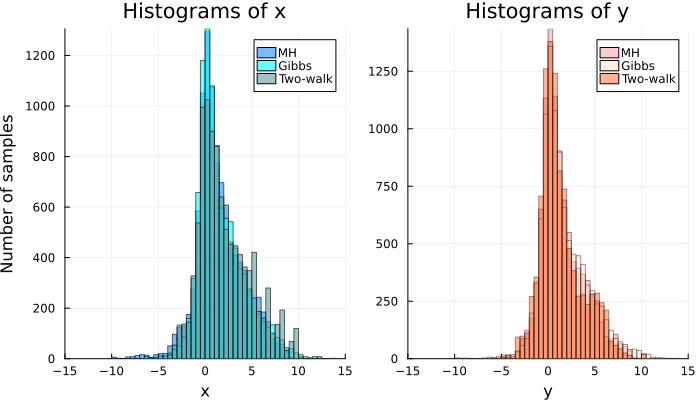

In [162]:
lim = 15
histx = histogram(samples2[1,:],color=:dodgerblue,alpha = 0.6,xlim=(-lim,lim),label="MH", title="Histograms of x",ylabel="Number of samples",
xlabel="x")
histx = histogram!(x,color=:cyan,label="Gibbs",alpha = 0.6)
histx = histogram!(samples2b[1,:],color=:cadetblue,label="Two-walk",alpha = 0.6)

histy = histogram(samples2[2,:],color=:lightcoral,alpha = 0.4,xlim=(-lim,lim),label="MH", title="Histograms of y",xlabel="y")
histy = histogram!(y,color=:peachpuff,label="Gibbs",alpha = 0.4)
histy = histogram!(samples2b[2,:],color=:orangered,label="Two-walk",alpha = 0.4)

plot(histx,histy,layout=(1,2),size=(700,400))

#savefig("4_Comparisonhistograms.png")